In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
from datetime import datetime, date
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import spacy


In [2]:
start_page=6
end_page=7
start_url = 'https://www.in.gr/tags/metoo/page/'


In [3]:
for page_num in range(start_page, end_page+1):
  page_url = start_url + str(page_num)
  print(page_url)

https://www.in.gr/tags/metoo/page/6
https://www.in.gr/tags/metoo/page/7


In [4]:
ingr_article_links = []

for page_num in range(start_page, end_page+1):
  page_url = start_url + str(page_num)
  response = requests.get(page_url)
  doc = BeautifulSoup(response.text, 'html.parser')
  ingr_original = doc.find('div',  attrs={'class': 'wrap-archive-posts'}).find_all('a', attrs={'class': 'is-block hover-underline'})# πήρα τον γενικό κώδικα που περιλαμβάνει όλα τα λινκσ
  for i in ingr_original:
    end = str(i).find('>')# το > δειχνει το τελος του link
    link = str(i)[42:end-1]#42 χαρακτήρες  <a href=" ετσι ζητάμε να πάρει μόνο το λινκ
    if (link not in ingr_article_links):
      ingr_article_links.append(link)

In [5]:
ingr_original

[<a class="is-block hover-underline" href="https://www.in.gr/2021/02/06/greece/ntora-makrygianni-den-ginetai-enas-psyxika-diataragmenos-na-didaskei-se-theatrikes-sxoles/"><h3 class="o-head whsk-is-size-normal whsk-is-size-small-touch is-semibold is-darkblue">Ξεσπά η Ντόρα Μακρυγιάννη: «Δεν γίνεται ένας ψυχικά διαταραγμένος να διδάσκει σε θεατρικές σχολές»</h3> </a>,
 <a class="is-block hover-underline" href="https://www.in.gr/2021/02/05/greece/leyteris-gkionakis-gia-gnosto-skinotheti-mou-zitise-na-kano-pragmata-pou-de-mporoun-na-eipothoun/"><h3 class="o-head whsk-is-size-normal whsk-is-size-small-touch is-semibold is-darkblue">Συγκλονίζει ο Λευτέρης Γκιωνάκης για γνωστό σκηνοθέτη: «Μου ζήτησε να κάνω πράγματα που δε μπορούν να ειπωθούν»</h3> </a>,
 <a class="is-block hover-underline" href="https://www.in.gr/2021/02/05/apopsi/o-viastis-kai-o-kakos-o-lykos-dyo-mythoi-pou-mas-vasanisan-poly/"><h3 class="o-head whsk-is-size-normal whsk-is-size-small-touch is-semibold is-darkblue">Ο βιαστής

In [6]:
print(len('[<a class="is-block hover-underline" href="'))

43


In [7]:
ingr_article_links

['https://www.in.gr/2021/03/09/apopsi/to-klima/',
 'https://www.in.gr/2021/03/07/greece/natalia-germanou-kata-darra-einai-akraia-kai-ntropiastiki-antilipsi-ta-ithele-kai-ta-epathe/',
 'https://www.in.gr/2021/03/07/apopsi/sygkalypseis-kai-apokalypseis/',
 'https://www.in.gr/2021/03/05/greece/elliniko-metoo-kai-o-kindynos-paraviasis-tou-tekmiriou-tis-athootitas/',
 'https://www.in.gr/2021/03/05/greece/eirini-nikolopoulou-exo-apolythei-epeidi-antedrasa-se-seksoualiki-parenoxlisi/',
 'https://www.in.gr/2021/03/05/greece/elliniko-metoo-sto-mikroskopio-tou-eisaggelea-dyo-gnostoi-skinothetes/',
 'https://www.in.gr/2021/03/04/apopsi/elliniko-metoo-oi-pollaploi-mixanismoi-tis-sygkalypsis/',
 'https://www.in.gr/2021/03/04/greece/kougias-gia-ti-nea-minysi-kata-lignadi-tha-apantisoume-minysi-den-exoume-kamia-anisyxia/',
 'https://www.in.gr/2021/03/04/greece/sakellaropoulou-pandimia-oksyne-tis-diakriseis-enantion-ton-gynaikon-ti-eipe-gia-metoo/',
 'https://www.in.gr/2021/03/04/go-fun/fizz/ioanna-as

In [8]:
full_articles_list = []
for url in ingr_article_links:
  response  = requests.get(url)
  soup = BeautifulSoup(response.text, 'html.parser')
  article_dict = {}

  try:
    title = soup.find('h1').text
    article_dict['title'] = title
  except:
    article_dict['title'] = ''
    pass

  try: #λεμε να ενωσει παραγραφους
    p_texts_list = []
    paragraphs = soup.find_all('p')
    for p in paragraphs:
      p_texts_list.append(p.text)
      full_text = ' '.join(p_texts_list)
      full_text = "".join(full_text.splitlines())
      article_dict['full_text'] = full_text
  except:
    article_dict['full_text'] = ''
    pass

  try:
    author = soup.find('div' , {'class': "author-c"}).text.strip()
    article_dict['author'] = author
  except:
    article_dict['author'] = ''
    pass
  try:
    cnt = 0
    feb = False                                                 #μετρητης, αρχη απο 0
    date = soup.find_all('span', {'class': "is-sans-serif-font"}) #το date ουσιαστηκα ειναι λιστα
    for i in date:                                                #λουπαρουμε την λιστα
      if("Φεβρουαρίου " not in i.text):                              # καθε φορα που δεν βρίσκει στο κειμενο τη λέξη "Φεβρουαρίου"
        cnt += 1                                             #ανεβαζουμε τον μετρητη
      else:                                                         #οταν το βρει
        ind_date =  cnt;
        feb = True
        if("2021" not in i.text):
          feb = False
    if(feb):
      article_dict['date'] = date[ind_date].text
  except:
    article_dict['date'] = 'No date found'
  if(feb):
    full_articles_list.append(article_dict)

In [9]:
full_articles_list

[{'title': ' Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελιών στον χώρο του θεάτρου – Ποιοι έχουν χάσει τον ύπνο τους',
  'full_text': 'ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελιών στον χώρο του θεάτρου – Ποιοι έχουν χάσει τον ύπνο τους Η αρχή έγινε έξω από τον χώρο του θεάτρου. Η αποκάλυψη της Σοφίας Μπεκατώρου σήκωσε μια φουρτούνα, η οποία αποκάλυψε το βρώμικο μυστικό της ελληνικής κοινωνίας. Τις κραυγές πίσω από τις κλειστές πόρτες, τις προσβολές στους χώρους εργασίας, τις μελανιές στο σώμα για τις οποίες ο περισσότερος κόσμος κάνει τα στραβά μάτια. Τη σκυτάλη πήρε ο καλλιτεχνικός κόσμος με τη Ζέτα Δούκα να κάνει την αρχή, καταγγέλλοντας τον Γιώργο Κιμούλη για λεκτική και σωματική βία. Σύντομα, οι ψίθυροι που κυκλοφορούσαν χρόνια στα καμαρίνια και στα θέατρα έγιναν όλο και πιο δυνατοί. Αρκετοί από αυτούς τους ψιθύρους ήταν για ένα συγκεκριμένο πρόσωπο: τον Δημήτρη Λιγνάδη, έναν από τους κορυφαίους σκηνοθέτες και ηθοποιούς της χώρας μας. Η πτώση του ήταν εξίσου θε

In [10]:
ingr_df = pd.DataFrame(full_articles_list)

In [11]:
ingr_df['day'] = ingr_df['date'].astype(str).str[:2]
ingr_df['month'] = "2"
ingr_df['year'] = "2021"
ingr_df['datetime'] = ingr_df['date'].astype(str).str[:2] + "/02/21 " + ingr_df['date'].astype(str).str[22:]

In [12]:
ingr_df

,title,full_text,author,date,day,month,year,datetime
0,Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελ...,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,Σύνταξη,28 Φεβρουαρίου 2021 | 23:36,28,2,2021,28/02/21 23:36
1,Μαρία Ναυπλιώτου για σεξουαλική κακοποίηση : ...,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,Σύνταξη,28 Φεβρουαρίου 2021 | 19:38,28,2,2021,28/02/21 19:38
2,Χαμός στην Αγγλία : Μηνύσεις από 17 αθλήτριες...,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,Σύνταξη,27 Φεβρουαρίου 2021 | 20:41,27,2,2021,27/02/21 20:41
3,Σοφία Μπεκατώρου : Δυστυχώς στην Ελλάδα δεν ε...,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,Σύνταξη,27 Φεβρουαρίου 2021 | 14:06,27,2,2021,27/02/21 14:06
4,Μάρα Δαρμουσλή: Αποκαλύπτει την σεξουαλική επ...,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,Σύνταξη,27 Φεβρουαρίου 2021 | 09:19,27,2,2021,27/02/21 09:19
...,...,...,...,...,...,...,...,...
65,Μαριάννα Τουμασάτου: «Δεν μπορώ να ακούω για ...,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,Σύνταξη,03 Φεβρουαρίου 2021 | 20:37,03,2,2021,03/02/21 20:37
66,Κανένα ταλέντο και καμιά μεγαλοφυΐα δεν δικαι...,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,Λευτέρης Θ. Χαραλαμπόπουλος,02 Φεβρουαρίου 2021 | 22:17,02,2,2021,02/02/21 22:17
67,Αυτό είναι το ελληνικό #Metoo – «Μη φοβάστε! ...,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,Σύνταξη,02 Φεβρουαρίου 2021 | 12:11,02,2,2021,02/02/21 12:11
68,Έβαν Ρέιτσελ Γουντ : Καταγγέλλει «φρικτή» κακ...,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,Σύνταξη,01 Φεβρουαρίου 2021 | 20:17,01,2,2021,01/02/21 20:17


Text(0.5, 1.02, ' IN.gr: Συχνότητα εμφάνισης της κάθε ημέρας')

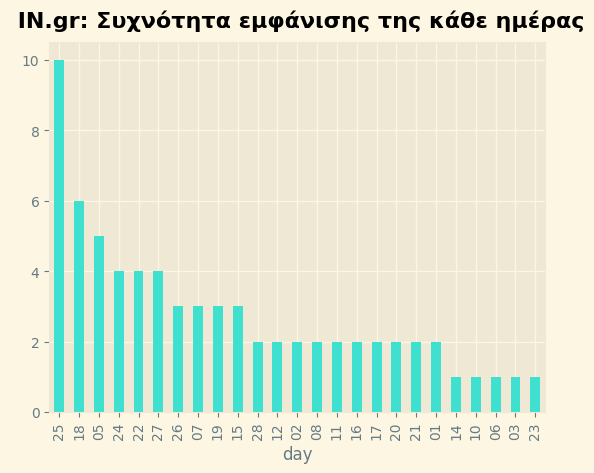

In [105]:
ingr_df['day'].value_counts().plot(kind='bar', color='turquoise')

plt.title(' IN.gr: Συχνότητα εμφάνισης της κάθε ημέρας', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' IN.gr: Αριθμός των άρθρων τον Φεβρουάριο')

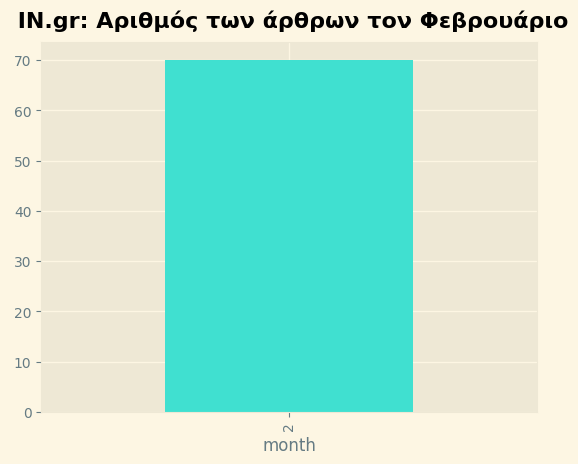

In [106]:
ingr_df['month'].value_counts().plot(kind='bar' , color='turquoise')
plt.title(' IN.gr: Αριθμός των άρθρων τον Φεβρουάριο', y=1.02, fontweight='bold')

In [15]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [16]:
text = ingr_df['full_text'].str.cat(sep = ' ')

In [17]:
!python -m spacy download el_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 61.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [18]:
nlp = spacy.load('el_core_news_sm')

In [19]:
full_doc= nlp(text)

In [20]:
full_doc[:200]

ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελιών στον χώρο του θεάτρου – Ποιοι έχουν χάσει τον ύπνο τους Η αρχή έγινε έξω από τον χώρο του θεάτρου. Η αποκάλυψη της Σοφίας Μπεκατώρου σήκωσε μια φουρτούνα, η οποία αποκάλυψε το βρώμικο μυστικό της ελληνικής κοινωνίας. Τις κραυγές πίσω από τις κλειστές πόρτες, τις προσβολές στους χώρους εργασίας, τις μελανιές στο σώμα για τις οποίες ο περισσότερος κόσμος κάνει τα στραβά μάτια. Τη σκυτάλη πήρε ο καλλιτεχνικός κόσμος με τη Ζέτα Δούκα να κάνει την αρχή, καταγγέλλοντας τον Γιώργο Κιμούλη για λεκτική και σωματική βία. Σύντομα, οι ψίθυροι που κυκλοφορούσαν χρόνια στα καμαρίνια και στα θέατρα έγιναν όλο και πιο δυνατοί. Αρκετοί από αυτούς τους ψιθύρους ήταν για ένα συγκεκριμένο πρόσωπο: τον Δημήτρη Λιγνάδη, έναν από τους κορυφαίους σκηνοθέτες και ηθοποιούς της χώρας μας. Η πτώση του ήταν εξίσου θεαματική με την άνοδό του: έπειτα από τρεις διαφορετικές καταγγελίες, βρέθηκε κατηγορούμενος για βιασμούς κατά συρροή. Ακολουθεί η σύλληψ

In [21]:
lemmatized_text = ' '.join(token.lemma_ for token in full_doc)

In [22]:
lemmatized_text[:1000]

'ingr >ς Ελλάδα > ο Λιγνάδης είμαι μόνο ο αρχή : « Βροχή » καταγγελία σε ο χώρος ο θεάτρο – ποιοι έχω χάνω ο ύπνο μου ο αρχή γίνομαι έξω από ο χώρος ο θεάτρο . ο αποκάλυψη ο Σοφία Μπεκατώρου σήκωσε ένας φουρτούνα , ο οποίος αποκάλυψε ο βρώμικο μυστικός ο ελληνικός κοινωνία . Τις κραυγή πίσω από ο κλειστής πόρτης , ο προσβολός σε ο χώρος εργασία , ο μελανιά σε ο σώμα για ο οποίος ο περισσότερος κόσμος κάνω ο στραβά μάτι . Τη σκυτάλος πήρε ο καλλιτεχνικός κόσμος με ο Ζέτα Δούκα να κάνω ο αρχή , καταγγέλλω ο Γιώργος κιμούλη για λεκτικός και σωματικός βία . σύντομα , ο ψίθυρος που κυκλοφορώ χρόνος σε ο καμαρίνια και σε ο θέατρο γίνομαι όλο και πιο δυνατοί . Αρκετός από αυτός ο ψιθύρους είμαι για ένας συγκεκριμένος πρόσωπος : ο Δημήτρη Λιγνάδης , ένας από ο κορυφαίους σκηνοθέτες και ηθοποιός ο χώρα μου . ο πτώση μου είμαι εξίσου θεαματικός με ο άνοδός μου : έπειτα από τρεις διαφορετικός καταγγελία , βρέθηκε κατηγορούμενος για βιασμός κατά συρροή . Ακολουθεί ο σύλληψη και ο προφυλάκιση μου .

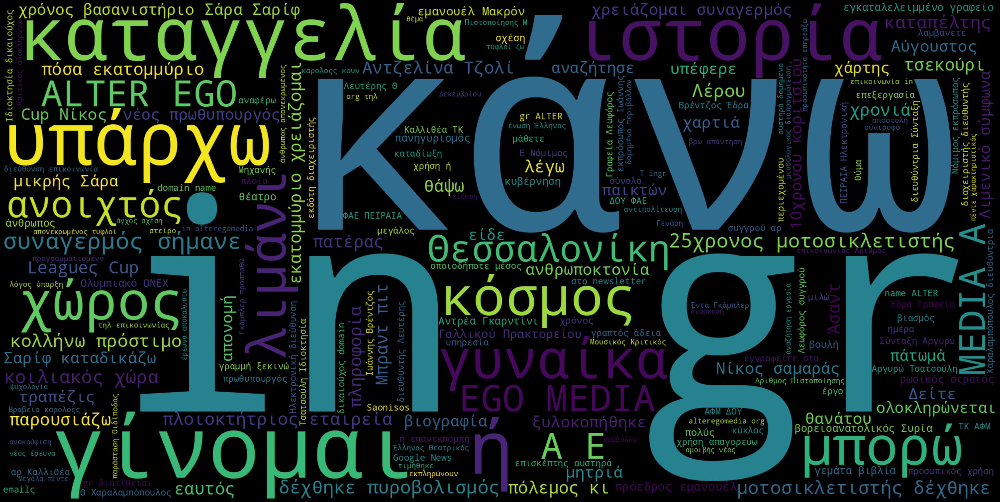

In [23]:
wordcloud2 = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(lemmatized_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud2, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [24]:
doc = nlp(ingr_df['full_text'][1])

In [25]:
for token in doc:
    print(token, token.lemma_)

ingr ingr
> >ς
Ελλάδα Ελλάδα
> >
Μαρία Μαρία
Ναυπλιώτου Ναυπλιώτου
για για
σεξουαλική σεξουαλικός
κακοποίηση κακοποίηση
: :
Τα ο
κόμματα κόμμα
να να
μιλήσουν μιλώ
για για
τα ο
θύματα θύμα
Με με
αφορμή αφορμή
τις ο
τελευταίες τελευταίος
εξελίξεις εξέλιξη
στο σε ο
χώρο χώρος
του ο
θεάτρου θεάτρο
με με
τις ο
καταγγελίες καταγγελία
κατά κατά
μεγάλων μεγάλος
ονομάτων ονομάτων
, ,
η ο
Μαρία Μαρία
Ναυπλιώτου Ναυπλιώτου
έκανε κάνω
μια ένας
ανάρτηση ανάρτηση
στα σε ο
social social
media media
γεμάτη γεμάτος
μηνύματα μηνύματα
. .
Ειδικότερα Ειδικότερα
, ,
η ο
   
ηθοποιός ηθοποιός
   
παρακινεί παρακινώ
όλα όλος
τα ο
θύματα θύμα
να να
βρουν βρουν
τη ο
δύναμη δύναμη
και και
να να
μιλήσουν μιλώ
για για
την ο
   
κακοποίηση κακοποίηση
   
που που
δέχτηκαν δέχτηκαν
, ,
καθώς καθώς
τώρα τώρα
δεν δεν
είναι είμαι
η ο
ώρα ώρα
για για
σιωπή σιωπή
. .
“ “
Αυτοί Αυτός
οι ο
άνθρωποι άνθρωπος
, ,
τα ο
θύματα θύμα
μας μου
χρειάζονται χρειάζομαι
. .
Καλώ καλώ
όλους όλος
τους ο
συναδέλφους συνάδελφος
μου μου
απ

In [26]:
' '.join(token.lemma_ for token in doc)

'ingr >ς Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικός κακοποίηση : ο κόμμα να μιλώ για ο θύμα με αφορμή ο τελευταίος εξέλιξη σε ο χώρος ο θεάτρο με ο καταγγελία κατά μεγάλος ονομάτων , ο Μαρία Ναυπλιώτου κάνω ένας ανάρτηση σε ο social media γεμάτος μηνύματα . Ειδικότερα , ο \xa0 ηθοποιός \xa0 παρακινώ όλος ο θύμα να βρουν ο δύναμη και να μιλώ για ο \xa0 κακοποίηση \xa0 που δέχτηκαν , καθώς τώρα δεν είμαι ο ώρα για σιωπή . “ Αυτός ο άνθρωπος , ο θύμα μου χρειάζομαι . καλώ όλος ο συνάδελφος μου από ο καλλιτεχνικός χώρος να πάρουν θέση για ο βία και ο κακοποίηση . ας ενθαρρύνω ο άνθρωπος που εγώ χρειάζομαι . Εύχομαι ο δημόσιος διάλογος να γίνομαι με σεβασμός , να σταματώ ο διασυρμός ( είτε ο θύματος είτε ο θύτη ) , να σταθούμε δίπλας σε ο παιδί που εγώ χρειάζομαι και τρομοκρατούνται καθημερινά από δήλωση και κινήσεις-πυροτεχνήματα . Εύχομαι να μείνουμε ένας ενωμένη γροθιά ενάντια σε οποιοσδήποτε μορφή βία . Εύχομαι ο κόμμα να σταματήσω να μιλάνες για ο πολιτική μου και να μιλώ για ο θύμα . Α

In [27]:
text

"ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελιών στον χώρο του θεάτρου – Ποιοι έχουν χάσει τον ύπνο τους Η αρχή έγινε έξω από τον χώρο του θεάτρου. Η αποκάλυψη της Σοφίας Μπεκατώρου σήκωσε μια φουρτούνα, η οποία αποκάλυψε το βρώμικο μυστικό της ελληνικής κοινωνίας. Τις κραυγές πίσω από τις κλειστές πόρτες, τις προσβολές στους χώρους εργασίας, τις μελανιές στο σώμα για τις οποίες ο περισσότερος κόσμος κάνει τα στραβά μάτια. Τη σκυτάλη πήρε ο καλλιτεχνικός κόσμος με τη Ζέτα Δούκα να κάνει την αρχή, καταγγέλλοντας τον Γιώργο Κιμούλη για λεκτική και σωματική βία. Σύντομα, οι ψίθυροι που κυκλοφορούσαν χρόνια στα καμαρίνια και στα θέατρα έγιναν όλο και πιο δυνατοί. Αρκετοί από αυτούς τους ψιθύρους ήταν για ένα συγκεκριμένο πρόσωπο: τον Δημήτρη Λιγνάδη, έναν από τους κορυφαίους σκηνοθέτες και ηθοποιούς της χώρας μας. Η πτώση του ήταν εξίσου θεαματική με την άνοδό του: έπειτα από τρεις διαφορετικές καταγγελίες, βρέθηκε κατηγορούμενος για βιασμούς κατά συρροή. Ακολουθεί η σύλλη

In [28]:
full_doc = nlp(text)

In [29]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [30]:
clear_text[200:400]

'ς φουρτούνα , ο οποίος αποκάλυψε ο βρώμικο μυστικός ο ελληνικός κοινωνία . Τις κραυγή πίσω από ο κλειστής πόρτης , ο προσβολός σε ο χώρος εργασία , ο μελανιά σε ο σώμα για ο οποίος ο περισσότερος κόσμ'

In [31]:
list(nlp.Defaults.stop_words)[0:20]

['τοσ',
 'ωσάν',
 'η',
 'παντού',
 'μας',
 'λοιπά',
 'πρώτη',
 'ίδιους',
 'είμαστε',
 'ιδίως',
 'κάποτε',
 'οποιοσδήποτε',
 'πάντα',
 'ταύτης',
 'νωρίς',
 'οποίες',
 'ίδιαν',
 'τίποτε',
 'ποιών',
 'κακά']

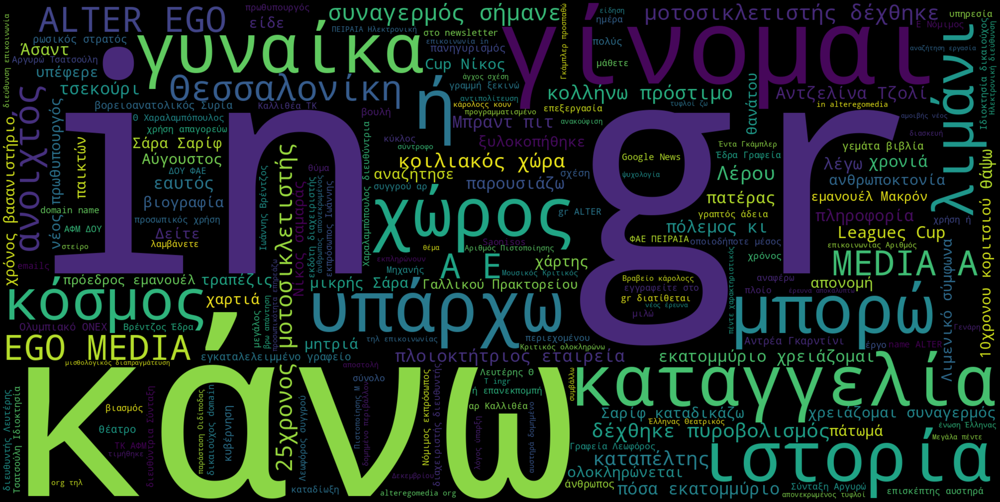

In [32]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [33]:
from sklearn.feature_extraction.text import CountVectorizer

In [34]:
cv = CountVectorizer()

In [35]:
count_vector = cv.fit_transform(ingr_df['full_text'])

In [36]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,00,000,02,10,100,100άδες,104,109,10χρονου,11,...,ώμο,ώρα,ώρες,ώριμα,ώριμο,ώστε,𝑮𝒊𝒐𝒓𝒈𝒐𝒔,𝑷𝒂𝒑𝒂𝒑𝒂𝒗𝒍𝒐𝒖,𝘿𝙞𝙢𝙞𝙩𝙧𝙞𝙨,𝙂𝙖𝙡𝙖𝙣𝙞𝙨
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,2,0,...,0,3,0,0,0,0,0,0,0,0
2,2,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,4,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,2,0,...,1,2,0,0,0,0,0,0,0,0


In [37]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words))

In [38]:
count_vector = cv.fit_transform(ingr_df['full_text'])

In [39]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,00,000,02,10,100,100άδες,104,109,10χρονου,11,...,ώθησε,ώμο,ώρα,ώρες,ώριμα,ώριμο,𝑮𝒊𝒐𝒓𝒈𝒐𝒔,𝑷𝒂𝒑𝒂𝒑𝒂𝒗𝒍𝒐𝒖,𝘿𝙞𝙢𝙞𝙩𝙧𝙞𝙨,𝙂𝙖𝙡𝙖𝙣𝙞𝙨
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,2,0,...,0,0,3,0,0,0,0,0,0,0
2,2,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,4,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,2,0,...,0,1,2,0,0,0,0,0,0,0


In [40]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), min_df=0.01, max_df=0.95)

In [41]:
count_vector = cv.fit_transform(ingr_df['full_text'])

In [42]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,00,000,02,10,100,100άδες,104,109,10χρονου,11,...,ώθησε,ώμο,ώρα,ώρες,ώριμα,ώριμο,𝑮𝒊𝒐𝒓𝒈𝒐𝒔,𝑷𝒂𝒑𝒂𝒑𝒂𝒗𝒍𝒐𝒖,𝘿𝙞𝙢𝙞𝙩𝙧𝙞𝙨,𝙂𝙖𝙡𝙖𝙣𝙞𝙨
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,2,0,...,0,0,3,0,0,0,0,0,0,0
2,2,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,4,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,2,0,...,0,1,2,0,0,0,0,0,0,0


In [43]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20)
count_vector = cv.fit_transform(ingr_df['full_text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,25χρονος,ego,gr,in,league,media,γίνεται,δέχθηκε,επικοινωνίας,θεσσαλονίκη,ιστορία,κι,λιμάνι,νέα,ξεκίνησε,σήμανε,σύμφωνα,χρήση,χρόνια,χώρα
0,0,2,4,5,6,2,0,0,2,0,0,1,0,2,0,0,3,2,2,0
1,2,2,3,4,2,3,4,2,2,2,2,4,3,2,2,2,2,2,4,2
2,0,2,3,4,3,2,0,0,2,0,0,0,0,2,0,0,4,2,1,0
3,0,2,3,4,2,2,0,0,2,0,2,1,0,5,0,0,1,2,0,0
4,2,2,3,4,2,2,3,3,2,2,2,4,3,2,2,2,2,2,4,2


In [44]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20, token_pattern = '\\bκυβ[α-ωά-ώ]*\\b')
count_vector = cv.fit_transform(ingr_df['full_text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,κυβέρνηση,κυβέρνησης,κυβερνήσεις,κυβερνητικά,κυβερνητικές,κυβερνητική,κυβερνητικής,κυβερνητικού,κυβερνητικό
0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0


In [45]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2, 2))
count_vector = cv.fit_transform(ingr_df['full_text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,25χρονος μοτοσικλετιστής,alter ego,ego media,in gr,ανοιχτό καταπέλτη,δέχθηκε πυροβολισμό,θεσσαλονίκη 25χρονος,καταπέλτη κολλήσει,κοιλιακή χώρα,κολλήσει πρόστιμο,λέρου ανοιχτό,λιμάνι λέρου,μοτοσικλετιστής δέχθηκε,ξεκίνησε λιμάνι,πλοιοκτήτρια εταιρεία,πρόστιμο πλοιοκτήτρια,πυροβολισμό κοιλιακή,σήμανε θεσσαλονίκη,συναγερμός σήμανε,χώρα καταδίωξη
0,0,2,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,2,2,3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
2,0,2,2,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,2,2,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2,2,2,3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2


In [46]:
results.sum(axis =0).sort_values(ascending = False)

,0
in gr,225
25χρονος μοτοσικλετιστής,140
κοιλιακή χώρα,140
συναγερμός σήμανε,140
σήμανε θεσσαλονίκη,140
πυροβολισμό κοιλιακή,140
μοτοσικλετιστής δέχθηκε,140
alter ego,140
χώρα καταδίωξη,140
θεσσαλονίκη 25χρονος,140


In [47]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()

,0
in gr,225
25χρονος μοτοσικλετιστής,140
κοιλιακή χώρα,140
συναγερμός σήμανε,140
σήμανε θεσσαλονίκη,140


In [107]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20,
                     vocabulary = ['κακοποίηση', 'τέρας', 'υποστήριξη', 'θύμα', 'παραβίαση δικαιωμάτων'])
count_vector = cv.fit_transform(ingr_df['full_text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,κακοποίηση,τέρας,υποστήριξη,θύμα,παραβίαση δικαιωμάτων
0,0,0,0,1,0
1,3,0,0,0,0
2,3,0,0,0,0
3,1,0,0,0,0
4,0,0,0,0,0


from matplotlib import pyplot as plt
_df_0['κακοποίηση'].plot(kind='hist', bins=20, title='κακοποίηση')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['θύμα'].plot(kind='hist', bins=20, title='θύμα')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2.plot(kind='scatter', x='κακοποίηση', y='θύμα', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['τέρας']
  ys = series['κακοποίηση']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('τέρας', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('τέρας')
_ = plt.ylabel('κακοποίηση')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['τέρας']
  ys = series['θύμα']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_4.sort_values('τέρας', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('τέρας')
_ = plt.ylabel('θύμα')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['τέρας']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'τέρας'}, axis=1)
              .sort_values('τέρας', ascending=True))
  xs = counted['τέρας']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_5.sort_values('τέρας', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('τέρας')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['υποστήριξη']
  ys = series['κακοποίηση']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_6.sort_values('υποστήριξη', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('υποστήριξη')
_ = plt.ylabel('κακοποίηση')

from matplotlib import pyplot as plt
_df_7['κακοποίηση'].plot(kind='line', figsize=(8, 4), title='κακοποίηση')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_8['θύμα'].plot(kind='line', figsize=(8, 4), title='θύμα')
plt.gca().spines[['top', 'right']].set_visible(False)

In [49]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [50]:
tfidf_vectorizer = TfidfVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(ingr_df['full_text'])

In [51]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
results.head()

,10χρονου,15,17673,19,2021,2023,2024,2025,21,2107547007,...,χώρας,χώρο,χώρος,χώρου,χώρους,ψυχολογία,όρους,ύπαρξης,ώρα,ώρες
0,0.000000,0.000000,0.015110,0.000000,0.0000,0.000000,0.015110,0.000000,0.0,0.015110,...,0.043286,0.07022,0.046318,0.0,0.077199,0.000000,0.0,0.000000,0.000000,0.0
1,0.062855,0.028061,0.026899,0.000000,0.0000,0.061966,0.026899,0.028864,0.0,0.026899,...,0.000000,0.08334,0.000000,0.0,0.000000,0.028864,0.0,0.028061,0.164932,0.0
2,0.000000,0.056703,0.027178,0.075495,0.0000,0.000000,0.027178,0.145814,0.0,0.027178,...,0.077859,0.00000,0.000000,0.0,0.000000,0.029163,0.0,0.028351,0.000000,0.0
3,0.000000,0.063141,0.030264,0.000000,0.0867,0.000000,0.090792,0.097423,0.0,0.030264,...,0.000000,0.00000,0.000000,0.0,0.000000,0.064948,0.0,0.031571,0.247416,0.0
4,0.065347,0.029173,0.027966,0.155365,0.0000,0.064422,0.027966,0.030008,0.0,0.027966,...,0.000000,0.00000,0.000000,0.0,0.000000,0.030008,0.0,0.029173,0.114313,0.0


In [52]:
from sklearn.metrics.pairwise import cosine_similarity

In [53]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

<Axes: >

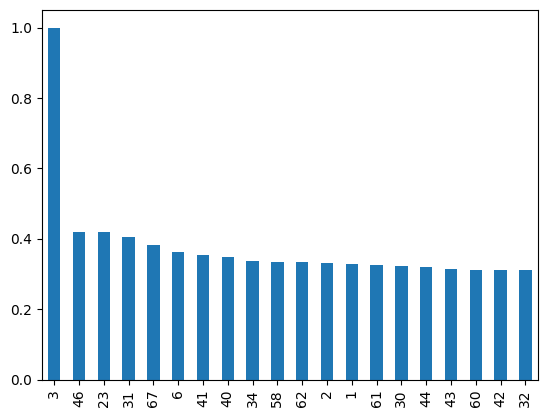

In [54]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [55]:
ingr_df['full_text'].iloc[3]

"ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στην Ελλάδα δεν είμαστε ηγέτες σε θέματα φεμινισμού ή ισότητας των φύλων Η Σοφία Μπεκατώρου συγκλονίζει, μιλώντας στο AFP για την σεξουαλική κακοποίηση που υπέστη από παράγοντα της ελληνικής ομοσπονδίας . Με το θάρρος και τη δύναμη που έδειξε, η Ελληνίδα Ολυμπιονίκης της ιστιοπλοΐας άνοιξε τον… δρόμο για το ελληνικό «#MeToo». Η Σοφία Μπεκατώρου τόνισε στο γαλλικό πρακτορείο ειδήσεων, πως έκανε αυτό που έπρεπε, ακόμη κι εάν ήταν αργά. «Αυτό το άτομο θα μπορούσε να επιτεθεί και σε άλλα παιδιά», λέει η 43χρονη μητέρα δύο παιδιών, η οποία στους Ολυμπιακούς Αγώνες του 2008 κατέκτησε το χάλκινο μετάλλιο στο Yngling. «Πρέπει να καταλάβετε ότι ο αθλητισμός είναι προέκταση της κοινωνίας. Και στην Ελλάδα οι συνθήκες είναι πιο περίπλοκες για τις γυναίκες», τονίζει η Ελληνίδα Ολυμπιονίκης. «Είμαι χαρούμενη γιατί πολλοί άνθρωποι μιλούν δημόσια, μιλούν για τις επιθέσεις που υπέστησαν και απευθύνονται στις Αρχές. Οταν κατέκτησα το χρυσό μετάλλιο, ήταν υπέρ

In [56]:
ingr_df['full_text'].iloc[0]

'ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελιών στον χώρο του θεάτρου – Ποιοι έχουν χάσει τον ύπνο τους Η αρχή έγινε έξω από τον χώρο του θεάτρου. Η αποκάλυψη της Σοφίας Μπεκατώρου σήκωσε μια φουρτούνα, η οποία αποκάλυψε το βρώμικο μυστικό της ελληνικής κοινωνίας. Τις κραυγές πίσω από τις κλειστές πόρτες, τις προσβολές στους χώρους εργασίας, τις μελανιές στο σώμα για τις οποίες ο περισσότερος κόσμος κάνει τα στραβά μάτια. Τη σκυτάλη πήρε ο καλλιτεχνικός κόσμος με τη Ζέτα Δούκα να κάνει την αρχή, καταγγέλλοντας τον Γιώργο Κιμούλη για λεκτική και σωματική βία. Σύντομα, οι ψίθυροι που κυκλοφορούσαν χρόνια στα καμαρίνια και στα θέατρα έγιναν όλο και πιο δυνατοί. Αρκετοί από αυτούς τους ψιθύρους ήταν για ένα συγκεκριμένο πρόσωπο: τον Δημήτρη Λιγνάδη, έναν από τους κορυφαίους σκηνοθέτες και ηθοποιούς της χώρας μας. Η πτώση του ήταν εξίσου θεαματική με την άνοδό του: έπειτα από τρεις διαφορετικές καταγγελίες, βρέθηκε κατηγορούμενος για βιασμούς κατά συρροή. Ακολουθεί η σύλλη

In [57]:
arr = cosine_similarity(tfidf_matrix_train[0:10], tfidf_matrix_train[0:10])

In [58]:
import seaborn as sns

<Axes: title={'center': 'Βαθμός ομοιότητας των 10 πρώτων άρθρων'}>

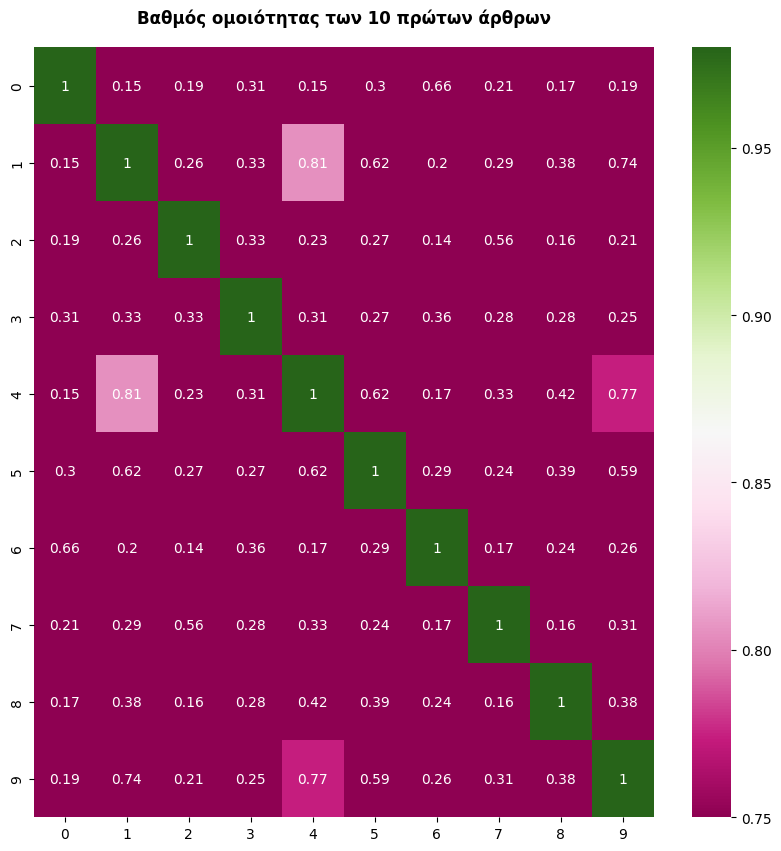

In [59]:
plt.figure(figsize=(10, 10))
# annot = True to print the values inside the square
plt.title('Βαθμός ομοιότητας των 10 πρώτων άρθρων', y=1.02, fontweight='bold') # το y ορίζει την απόσταση του τίτλου από το γράφημα
sns.heatmap(data=arr, annot=True, vmin=0.75, vmax=0.98, cmap="PiYG")

#plt.savefig('<το path και το όνομα του αρχείου>.png')

In [60]:
!python -m spacy download el_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 90.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [61]:
import pandas as pd
%matplotlib inline
import numpy as np
import glob
from sklearn.feature_extraction.text import CountVectorizer
from datetime import datetime

In [62]:
filepath = "https://raw.githubusercontent.com/datajour-gr/DataJournalism/main/Bachelor%20Lessons%202023/Lesson%2010/NRC_GREEK_Translated_6_2020.csv"

In [63]:
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(inplace = True, drop=True)

In [66]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
len(ingr_df)

70

In [68]:
ingr_df.head(3)

,title,full_text,author,date,day,month,year,datetime
0,Ο Λιγνάδης ήταν μόνο η αρχή: «Βροχή» καταγγελ...,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,Σύνταξη,28 Φεβρουαρίου 2021 | 23:36,28,2,2021,28/02/21 23:36
1,Μαρία Ναυπλιώτου για σεξουαλική κακοποίηση : ...,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,Σύνταξη,28 Φεβρουαρίου 2021 | 19:38,28,2,2021,28/02/21 19:38
2,Χαμός στην Αγγλία : Μηνύσεις από 17 αθλήτριες...,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,Σύνταξη,27 Φεβρουαρίου 2021 | 20:41,27,2,2021,27/02/21 20:41


In [69]:
ingr_df_fa = ingr_df[['datetime','full_text', 'day', 'month' ]]
ingr_df_fa = ingr_df_fa.rename(columns={'full_text': 'text'} )

In [70]:
ingr_df_fa = ingr_df_fa.rename(columns={'time': 'date'} )

In [71]:
ingr_df_fa.tail()

,datetime,text,day,month
65,03/02/21 20:37,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2
66,02/02/21 22:17,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2
67,02/02/21 12:11,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2
68,01/02/21 20:17,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,01,2
69,01/02/21 16:41,ingr > The Good Life > Culture Live > Σεξισμός...,01,2


In [72]:
ingr_df_fa.dtypes

,0
datetime,object
text,object
day,object
month,object


In [73]:
ingr_df_fa

,datetime,text,day,month
0,28/02/21 23:36,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2
1,28/02/21 19:38,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2
2,27/02/21 20:41,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2
3,27/02/21 14:06,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,27,2
4,27/02/21 09:19,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,27,2
...,...,...,...,...
65,03/02/21 20:37,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2
66,02/02/21 22:17,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2
67,02/02/21 12:11,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2
68,01/02/21 20:17,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,01,2


In [74]:
ingr_df_fa['datetime'] = pd.to_datetime(ingr_df_fa['datetime'], dayfirst=True)

<ipython-input-74-17afa0e52d0e>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ingr_df_fa['datetime'] = pd.to_datetime(ingr_df_fa['datetime'], dayfirst=True)


In [75]:
ingr_df_fa

,datetime,text,day,month
0,2021-02-28 23:36:00,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2
1,2021-02-28 19:38:00,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2
2,2021-02-27 20:41:00,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2
3,2021-02-27 14:06:00,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,27,2
4,2021-02-27 09:19:00,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,27,2
...,...,...,...,...
65,2021-02-03 20:37:00,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2
66,2021-02-02 22:17:00,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2
67,2021-02-02 12:11:00,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2
68,2021-02-01 20:17:00,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,01,2


In [76]:
emolex_df['word'].head(3)

,word
0,αφεση
1,ενορκη βεβαιωση
2,εχοντας


In [77]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word,
                      lowercase=False,
                      strip_accents = 'unicode',
                      stop_words= list(nlp.Defaults.stop_words),
                      ngram_range=(1, 2))

In [78]:
matrix = vec.fit_transform(ingr_df_fa['text'])
vocab = vec.get_feature_names_out()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια', 'βεβαιοτατα', 'γιατι', 'γρηγορα', 'γυρω', 'δεινα', 'δεξια', 'δηθεν', 'δηλαδη', 'διαρκως', 'δικα', 'δικο', 'δικοι', 'δικος', 'δικου', 'δικους', 'διολου', 'διπλα', 'διχως', 'εαν', 'εαυτο', 'εαυτον', 'εαυτου', 'εαυτους', 'εαυτων', 'εγιναν', 'εγινε',

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
wordcount_df.shape

(70, 13161)

In [80]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [82]:
# Φτιάξε μια λίστα με positive words
positive_words = emolex_df[emolex_df.Positive == 1]['word']

# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']

# Φτιάξε μια λίστα με anger words
angry_words = emolex_df[emolex_df.Anger == 1]['word']

# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']

# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']

# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']

# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']

In [83]:
trust_words

,word
8,αμην
15,γαμηλιο ταξιδι
24,διευθυντρια σχολειου
38,επικοινωνω
45,εκκλησια
...,...
13039,αληθης
13075,αναμφιβολως
13079,ανυπερβατος
13113,αναθηματικος


In [84]:
wordcount_df.tail(1)

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
69,0,0,0,20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [85]:
wordcount_df[trust_words].tail(1)

,αμην,γαμηλιο ταξιδι,διευθυντρια σχολειου,επικοινωνω,εκκλησια,εν τω μεταξυ,ευαγγελιο,κυριε,λιστα ελεγχου,λυρικη σκηνη,...,ηλιακο ωρολογιο,συνεργιστικος,διπλο ποδηλατο,ισαξιος,ανακωχη,αληθης,αναμφιβολως,ανυπερβατος,αναθηματικος,αποδειξη πληρωμης
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [86]:
wordcount_df[trust_words].sum(axis=1)

,0
0,37
1,15
2,9
3,19
4,21
...,...
65,19
66,20
67,21
68,23


In [87]:
ingr_df_fa.head(3)

,datetime,text,day,month
0,2021-02-28 23:36:00,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2
1,2021-02-28 19:38:00,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2
2,2021-02-27 20:41:00,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2


In [88]:
ingr_df_fa

,datetime,text,day,month
0,2021-02-28 23:36:00,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2
1,2021-02-28 19:38:00,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2
2,2021-02-27 20:41:00,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2
3,2021-02-27 14:06:00,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,27,2
4,2021-02-27 09:19:00,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,27,2
...,...,...,...,...
65,2021-02-03 20:37:00,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2
66,2021-02-02 22:17:00,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2
67,2021-02-02 12:11:00,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2
68,2021-02-01 20:17:00,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,01,2


In [89]:
ingr_df_fa=ingr_df_fa.reset_index()

In [90]:
ingr_df_fa['anger'] = wordcount_df[angry_words].sum(axis=1)

ingr_df_fa['positive'] = wordcount_df[positive_words].sum(axis=1)

ingr_df_fa['joy'] = wordcount_df[joy_words].sum(axis=1)

ingr_df_fa['disgust'] = wordcount_df[disgust_words].sum(axis=1)

ingr_df_fa['surprise'] = wordcount_df[surprise_words].sum(axis=1)

ingr_df_fa['trust'] = wordcount_df[trust_words].sum(axis=1)

ingr_df_fa['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)

ingr_df_fa['sadness'] = wordcount_df[sadness_words].sum(axis=1)

ingr_df_fa['negative'] = wordcount_df[negative_words].sum(axis=1)

ingr_df_fa['fear'] = wordcount_df[fear_words].sum(axis=1)

In [91]:
ingr_df_fa

,index,datetime,text,day,month,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,0,2021-02-28 23:36:00,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2,29,50,15,22,18,37,30,34,68,46
1,1,2021-02-28 19:38:00,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2,16,26,4,10,4,15,7,12,19,14
2,2,2021-02-27 20:41:00,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2,9,23,4,10,4,9,11,9,19,14
3,3,2021-02-27 14:06:00,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,27,2,17,37,11,8,8,19,19,8,28,14
4,4,2021-02-27 09:19:00,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,27,2,15,39,10,13,9,21,18,17,25,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,65,2021-02-03 20:37:00,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2,12,35,8,15,7,19,11,13,26,15
66,66,2021-02-02 22:17:00,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2,13,39,4,15,8,20,15,16,29,14
67,67,2021-02-02 12:11:00,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2,13,29,11,9,6,21,11,10,21,16
68,68,2021-02-01 20:17:00,ingr > Stories > Έβαν Ρέιτσελ Γουντ : Καταγγέλ...,01,2,28,27,2,20,5,23,9,21,32,23


In [92]:
ingr_df_fa.reset_index(inplace=True)
ingr_df_fa.set_index('datetime', inplace=True)
ingr_df_fa

,level_0,index,text,day,month,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
datetime,,,,,,,,,,,,,,,
2021-02-28 23:36:00,0,0,ingr > Ελλάδα > Ο Λιγνάδης ήταν μόνο η αρχή: «...,28,2,29,50,15,22,18,37,30,34,68,46
2021-02-28 19:38:00,1,1,ingr > Ελλάδα > Μαρία Ναυπλιώτου για σεξουαλικ...,28,2,16,26,4,10,4,15,7,12,19,14
2021-02-27 20:41:00,2,2,ingr > Σπορ > Άλλα Αθλήματα > Χαμός στην Αγγλί...,27,2,9,23,4,10,4,9,11,9,19,14
2021-02-27 14:06:00,3,3,ingr > Ελλάδα > Σοφία Μπεκατώρου : Δυστυχώς στ...,27,2,17,37,11,8,8,19,19,8,28,14
2021-02-27 09:19:00,4,4,ingr > Go Fun > Fizz > Μάρα Δαρμουσλή: Αποκαλύ...,27,2,15,39,10,13,9,21,18,17,25,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-03 20:37:00,65,65,ingr > Ελλάδα > Μαριάννα Τουμασάτου: «Δεν μπορ...,03,2,12,35,8,15,7,19,11,13,26,15
2021-02-02 22:17:00,66,66,ingr > Opinion > Κανένα ταλέντο και καμιά μεγα...,02,2,13,39,4,15,8,20,15,16,29,14
2021-02-02 12:11:00,67,67,ingr > Ελλάδα > Αυτό είναι το ελληνικό #Metoo ...,02,2,13,29,11,9,6,21,11,10,21,16


<Axes: xlabel='day'>

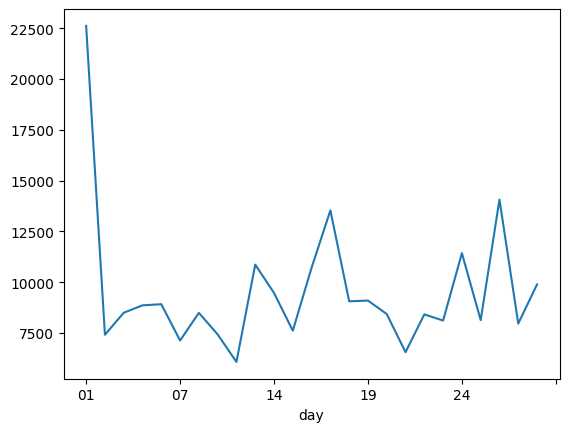

In [93]:
ingr_df_fa['text'].str.len().groupby(by=ingr_df_fa['day']).mean().plot()

<Axes: xlabel='datetime'>

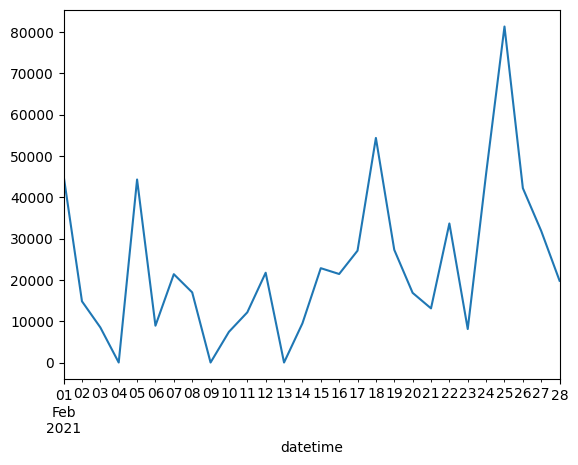

In [94]:
ingr_df_fa['text'].str.len().resample('D').sum().plot()

Text(0.5, 1.02, ' IN.gr: Aριθμός των κειμένων για κάθε ημέρα')

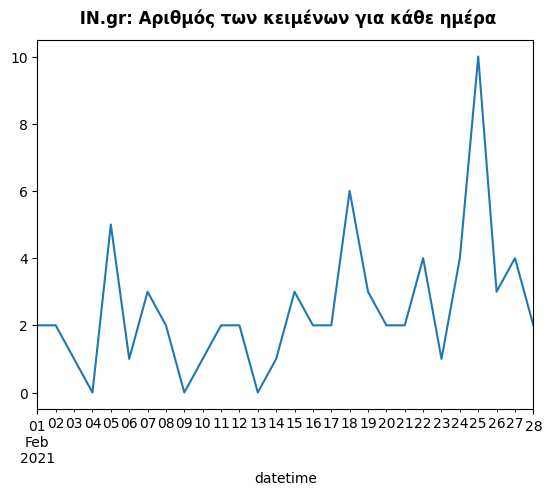

In [95]:
ingr_df_fa['text'].resample('D').count().plot()
plt.title(' IN.gr: Aριθμός των κειμένων για κάθε ημέρα', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' IN.gr: Συνολική τιμή της θετικότητας για κάθε ημέρα')

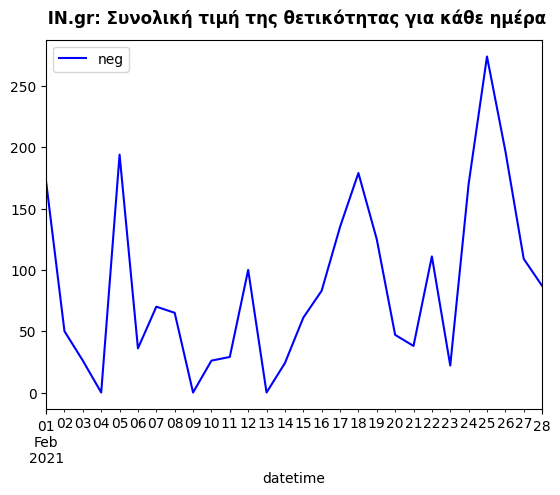

In [96]:
ingr_df_fa['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend()
plt.title(' IN.gr: Συνολική τιμή της θετικότητας για κάθε ημέρα', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' IN.gr: Συνολική τιμή της αρνητικότητας για κάθε ημέρα')

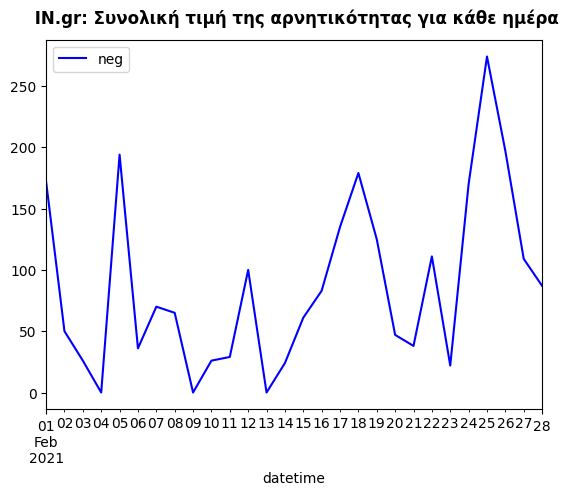

In [97]:
ingr_df_fa['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend()
plt.title(' IN.gr: Συνολική τιμή της αρνητικότητας για κάθε ημέρα', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' IN.gr: Εμπιστοσύνη ')

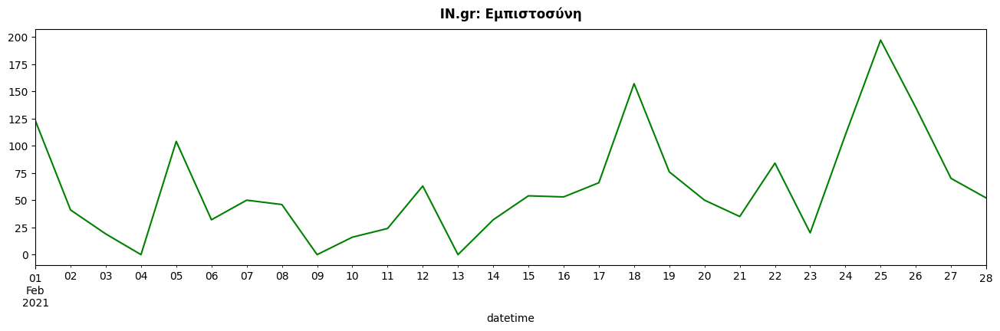

In [98]:
ingr_df_fa['trust'].resample('D').sum().plot(figsize=(16,4), color='green')
plt.title(' IN.gr: Εμπιστοσύνη ', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' IN.gr: Θυμός vs Χαρά')

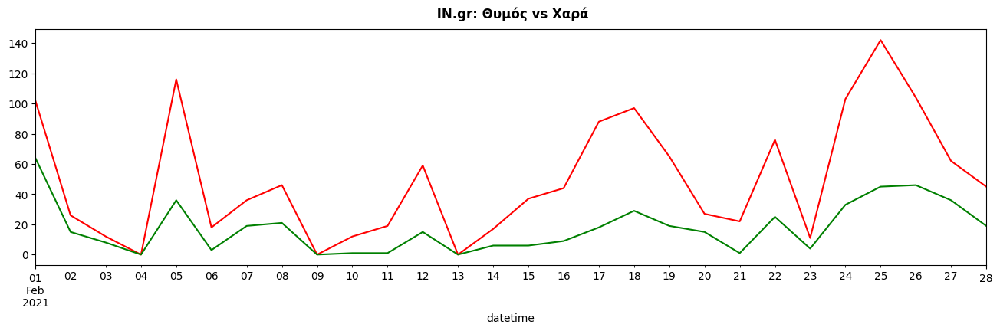

In [99]:
ax = ingr_df_fa['anger'].resample('D').sum().plot(figsize=(16,4), color = 'red')
ingr_df_fa['joy'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')
plt.title(' IN.gr: Θυμός vs Χαρά', y=1.02, fontweight='bold')

Text(0.5, 1.02, ' Newsbomb: Θετικότητα vs Αρνητικότητα vs Εμπιστοσύνη')

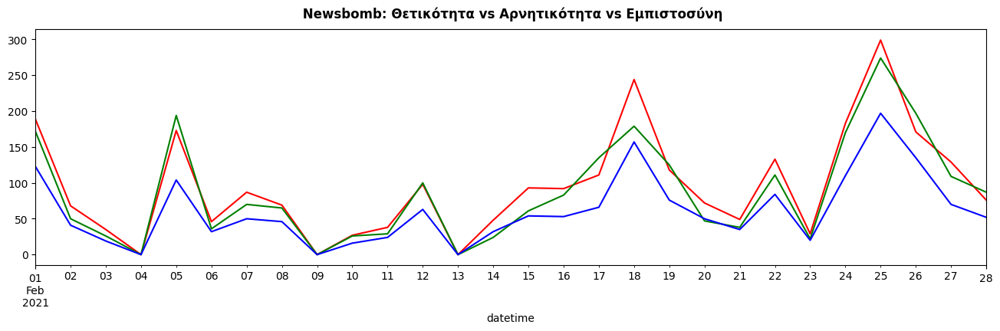

In [100]:
ax = ingr_df_fa['positive'].resample('D').sum().plot(figsize=(16,4), color = 'red')
ingr_df_fa['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')
ingr_df_fa['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
plt.title(' Newsbomb: Θετικότητα vs Αρνητικότητα vs Εμπιστοσύνη', y=1.02, fontweight='bold')

In [101]:
import matplotlib.pyplot as plt
plt.style.use('default')

In [102]:
#plt.style.use('classic')
#plt.style.use('ggplot')
plt.style.use('Solarize_Light2')
#plt.style.use('seaborn-v0_8-bright')

Text(0.5, 1.02, ' IN.gr: Θετικότητα vs Αρνητικότητα vs Εμπιστοσύνη vs Αηδία')

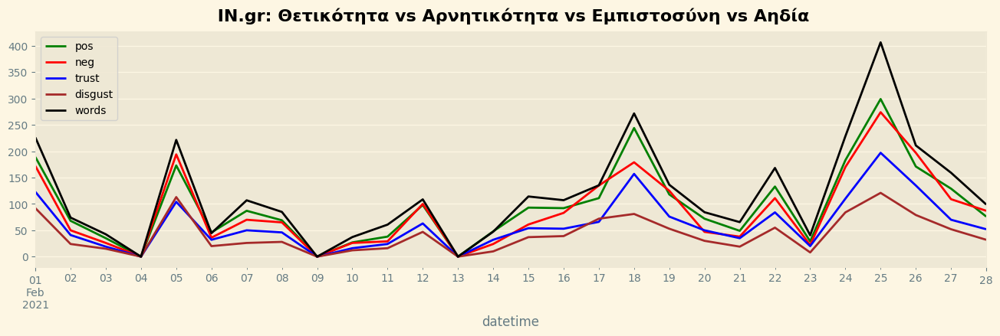

In [103]:
ax = ingr_df_fa['positive'].resample('D').sum().plot(figsize=(16,4),
                                                          color = 'g', label='pos')
ingr_df_fa['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax,
                                                   label = 'neg', color = 'r')
ingr_df_fa['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax,
                                                label = 'trust',color = 'blue').legend()
ingr_df_fa['disgust'].resample('D').sum().plot(figsize=(16,4), ax = ax,
                                                label = 'disgust',color = 'brown').legend()
(ingr_df_fa['text'].str.len().resample('D').sum()/200).plot(figsize=(16,4), ax = ax, # διαιρώ το mean των λέξεων με το 200 για να πλησιάσει στην κλίμακα τα άλλα
                                                label = 'words',color = 'black').legend()
plt.title(' IN.gr: Θετικότητα vs Αρνητικότητα vs Εμπιστοσύνη vs Αηδία', y=1.02, fontweight='bold')

Text(0.5, 1.02, 'IN.gr: Θετικότητα vs Αρνητικότητα')

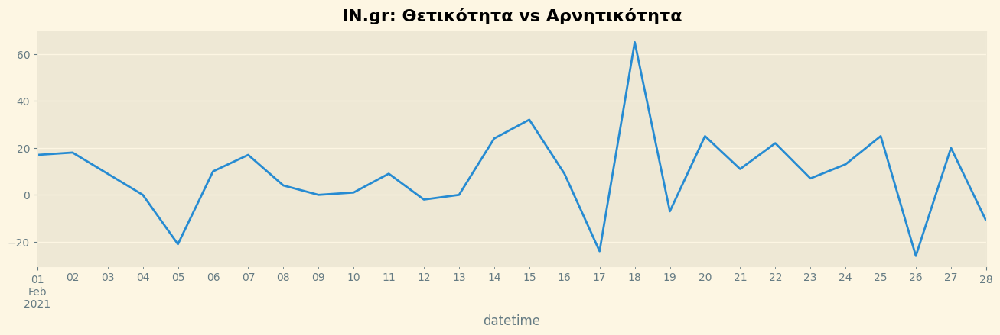

In [104]:
ingr_df_fa['pos/neg'] = ingr_df_fa['positive'] - ingr_df_fa['negative']
ingr_df_fa['pos/neg'].resample('D').sum().plot(figsize=(16,4))
plt.title('IN.gr: Θετικότητα vs Αρνητικότητα', y=1.02, fontweight='bold')